## Import all library

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import mne
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import pywt 
from PIL import Image
from utility import *

## Determine suitable constant to divide
* This is done by Visualize the min, max, mean, Q-10%, Q2, Q-90%, std  for each eeg file
* Choose the minimum of Q-10%, OR maximum of Q-90% as the constant to divide the whole eeg file
 

In [2]:
# Create empty dataframe
df_summary_spike    = pd.DataFrame(columns=["EEG file"] + AVE_CHANNELS_NAME)
df_summary_no_spike = pd.DataFrame(columns=["EEG file"] + AVE_CHANNELS_NAME)
df_summary_spike

,EEG file,Fp1-AVE,Fp2-AVE,F3-AVE,F4-AVE,C3-AVE,C4-AVE,P3-AVE,P4-AVE,O1-AVE,O2-AVE,F7-AVE,F8-AVE,T3-AVE,T4-AVE,T5-AVE,T6-AVE,Fz-AVE,Cz-AVE,Pz-AVE


In [3]:
def append_result(num, df_summary, df):
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Max)"]  , df.max(axis=0)[0].numpy() ))           # Add in the maximum value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Min)"]  , df.min(axis=0)[0].numpy() ))           # Add in the minimum value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Q-90%)"], df.quantile(0.10,axis=0).numpy() )) # Add in the 0.1 quantile value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Q2)"]   , df.quantile(0.50,axis=0).numpy() )) # Add in the Q2 value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Q-10%)"], df.quantile(0.90,axis=0).numpy() )) # Add in the 0.9 quantile value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Mean)"] , df.mean(axis=0).numpy() ))          # Add in the mean value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Std)"]  , df.std(axis=0).numpy() ))           # Add in the std value for each channel

    return df_summary


def get_list_seperately(df_summary):
    lengths      = len(df_summary)
    num_channels = len(AVE_CHANNELS_NAME)
    max_list, min_list, Q1_list, Q2_list, Q3_list, mean_list, std_list = np.zeros((lengths//7,num_channels)), np.zeros((lengths//7,num_channels)), np.zeros((lengths//7,num_channels)), np.zeros((lengths//7,num_channels)), np.zeros((lengths//7,num_channels)), np.zeros((lengths//7,num_channels)), np.zeros((lengths//7,num_channels))
    
    for i in range(lengths//7):
        max_list[i] = df_summary.iloc[i*7]
        min_list[i] = df_summary.iloc[i*7+1]
        Q1_list[i]  = df_summary.iloc[i*7+2]
        Q2_list[i]  = df_summary.iloc[i*7+3]
        Q3_list[i]  = df_summary.iloc[i*7+4]
        mean_list[i]= df_summary.iloc[i*7+5]
        std_list[i] = df_summary.iloc[i*7+6]
        
    dict1 = {"Max":max_list, "Min":min_list, "Q1":Q1_list, "Q2":Q2_list, "Q3":Q3_list, "mean":mean_list, "std":std_list}
    return dict1

def plot_summary(df_summary, title):
    dict1 = get_list_seperately(df_summary)
    
    for key in dict1:
        fig, ax = plt.subplots(len(AVE_CHANNELS_NAME),1,figsize=(20,40))
        for i, col in enumerate(AVE_CHANNELS_NAME):
            ax[i].plot(dict1[key][:,i], '--.',label=key)
            ax[i].set_title(col)
            ax[i].legend()

        plt.savefig(f"{VIS_FILE_DIRC}/{key}_{title}.png", transparent = False,  facecolor = 'white')

In [4]:
%%time
for num in range(1,41):
    df              = get_df(f'{CSV_FILE_DIRC}/eeg{num}.csv')       # Get the dataframe from the filename
    spike_locations = get_spike_location(num)                       # Get the spike label from the annotation.json
    data, label     = get_data_n_label(df, spike_locations) 
    
    if sum(label) == 0: # no spike:
        df_summary_no_spike = append_result(num, df_summary_no_spike, data.reshape(-1, len(AVE_CHANNELS_NAME))) 
    else:
        df_summary_no_spike = append_result(num, df_summary_no_spike, data[label==0].reshape(-1, len(AVE_CHANNELS_NAME))) 
        df_summary_spike    = append_result(num, df_summary_spike   , data[label==1].reshape(-1, len(AVE_CHANNELS_NAME))) 
    

The data from EEG_csv/eeg1.csv is loaded 
There is no spike in this eeg file
(252, 1280, 19)
The data from EEG_csv/eeg2.csv is loaded 
There is no spike in this eeg file
(43, 1280, 19)
The data from EEG_csv/eeg3.csv is loaded 
There is no spike in this eeg file
(88, 1280, 19)
The data from EEG_csv/eeg4.csv is loaded 
There is no spike in this eeg file
(245, 1280, 19)
The data from EEG_csv/eeg5.csv is loaded 
There is no spike in this eeg file
(236, 1280, 19)
The data from EEG_csv/eeg6.csv is loaded 
There is spike in this eeg file
Data before split : (481920, 19)
Data with spike   : (465280, 19)
Data without spike: (16640, 19)
Data after  split into window: (376, 1280, 19)
Labels: (376,)
Num spike: 13
The data from EEG_csv/eeg7.csv is loaded 
There is no spike in this eeg file
(311, 1280, 19)
The data from EEG_csv/eeg8.csv is loaded 
There is no spike in this eeg file
(243, 1280, 19)
The data from EEG_csv/eeg9.csv is loaded 
There is no spike in this eeg file
(322, 1280, 19)
The data f

In [5]:
# Set the columns 'EEG file' as index
df_summary_spike    = df_summary_spike.set_index('EEG file')
df_summary_no_spike = df_summary_no_spike.set_index('EEG file')

# Convert the whole dataframe to np.float32 (original is object)
df_summary_spike    = df_summary_spike.astype(np.float32)
df_summary_no_spike = df_summary_no_spike.astype(np.float32)

print("DONE")

DONE


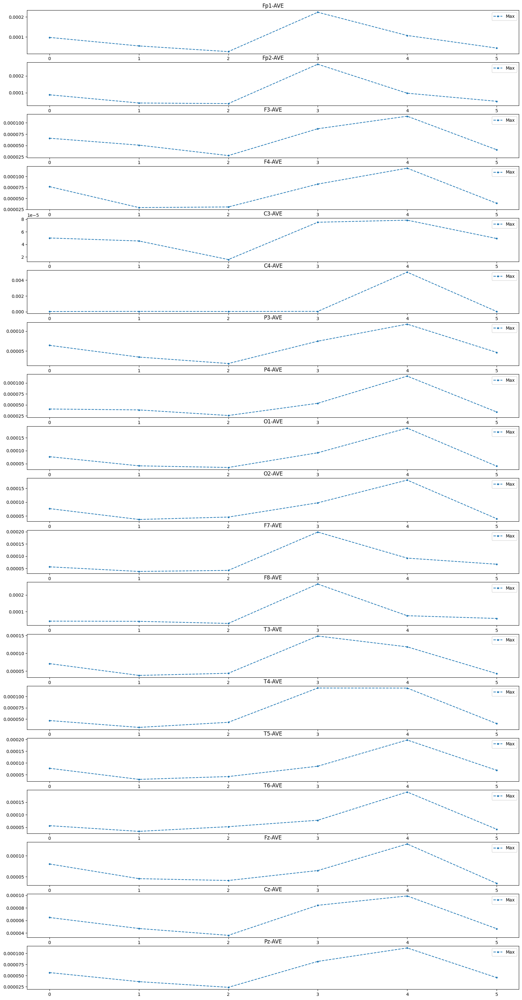

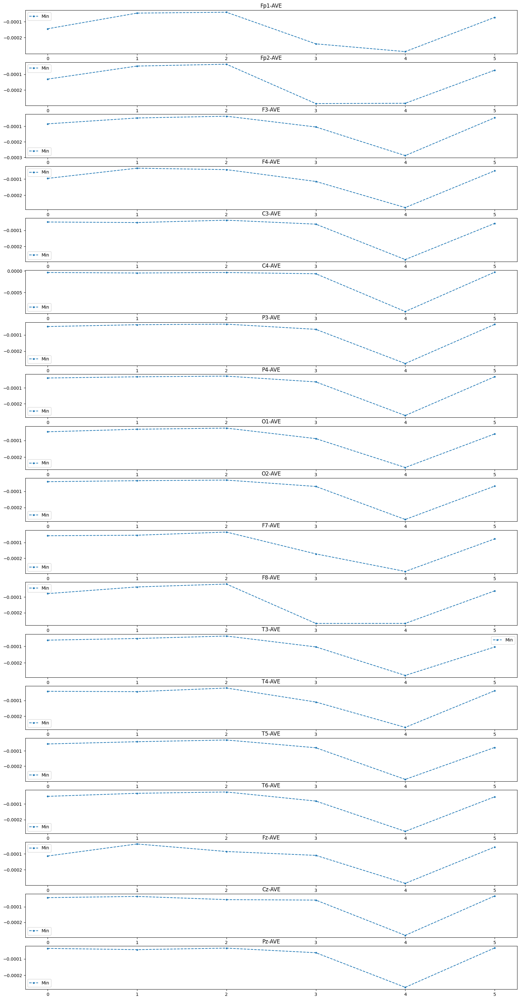

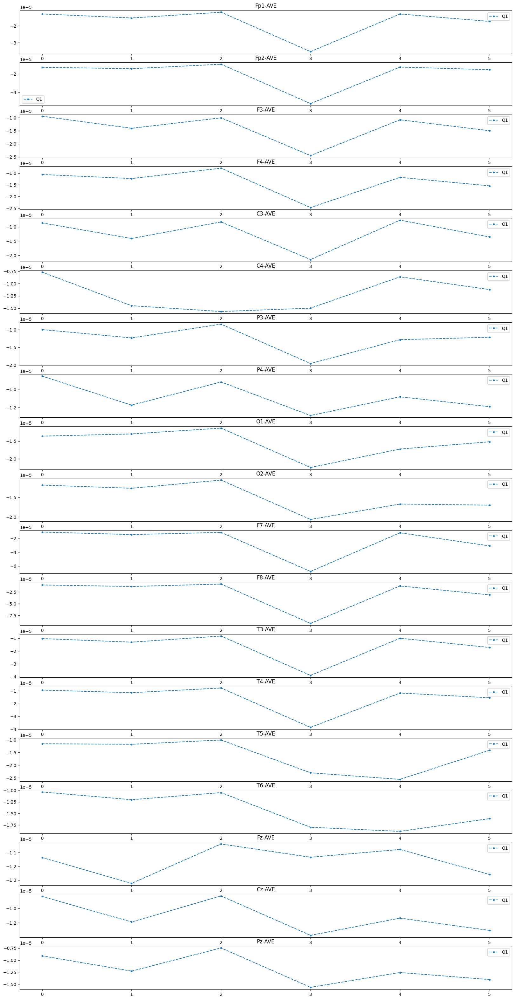

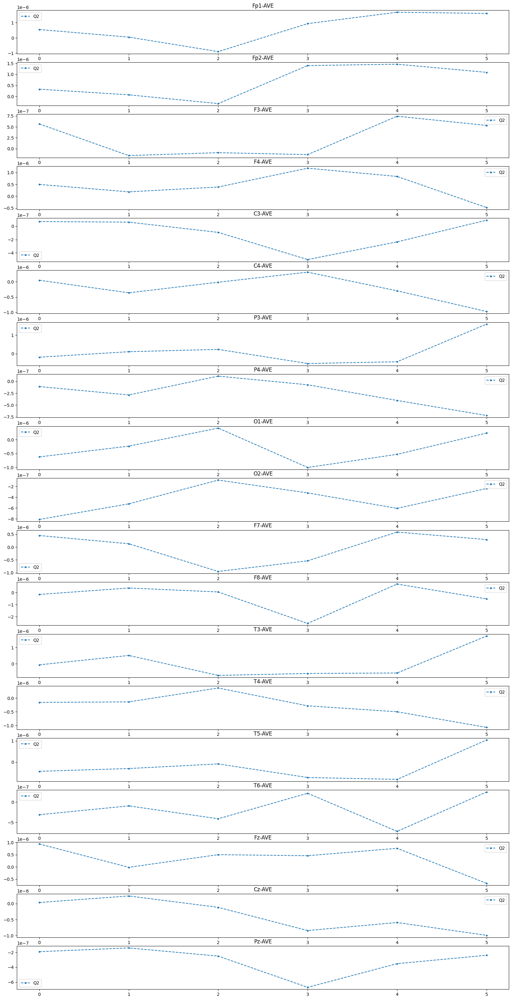

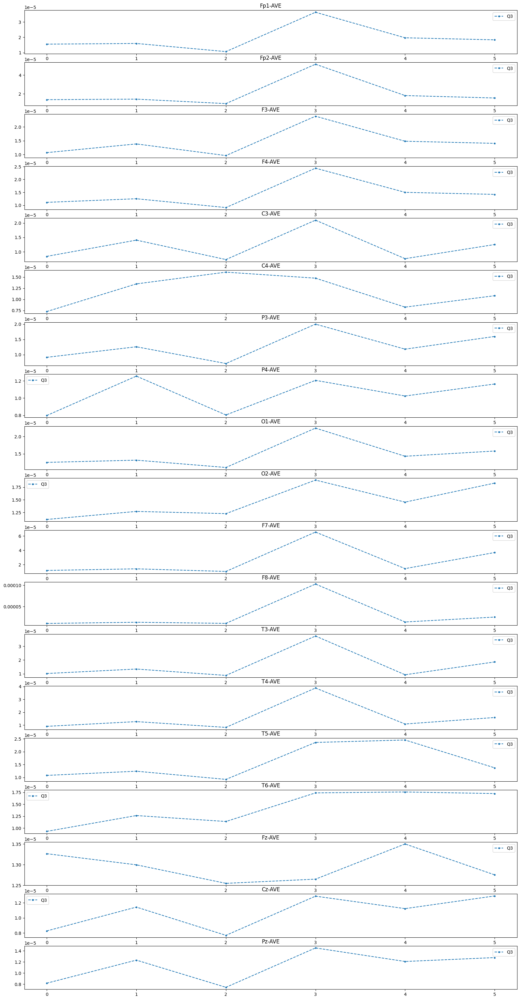

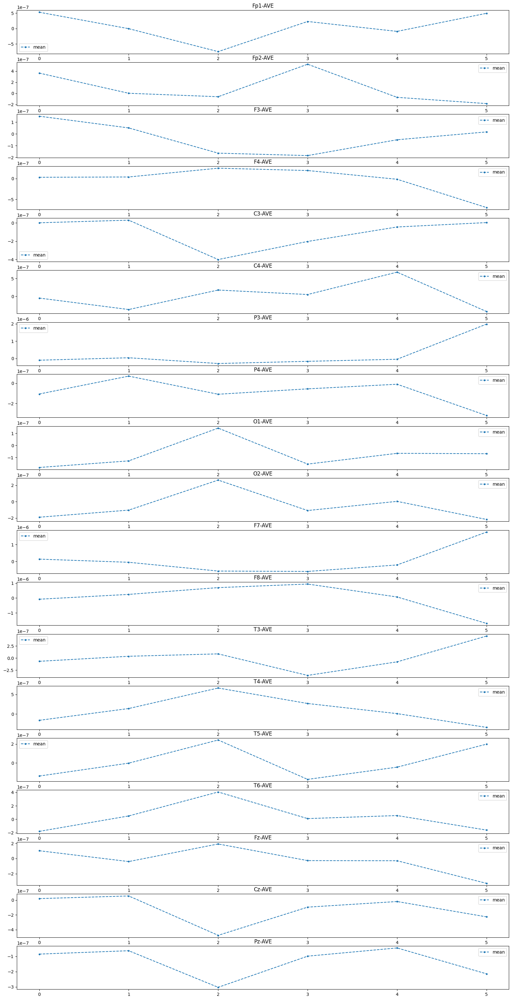

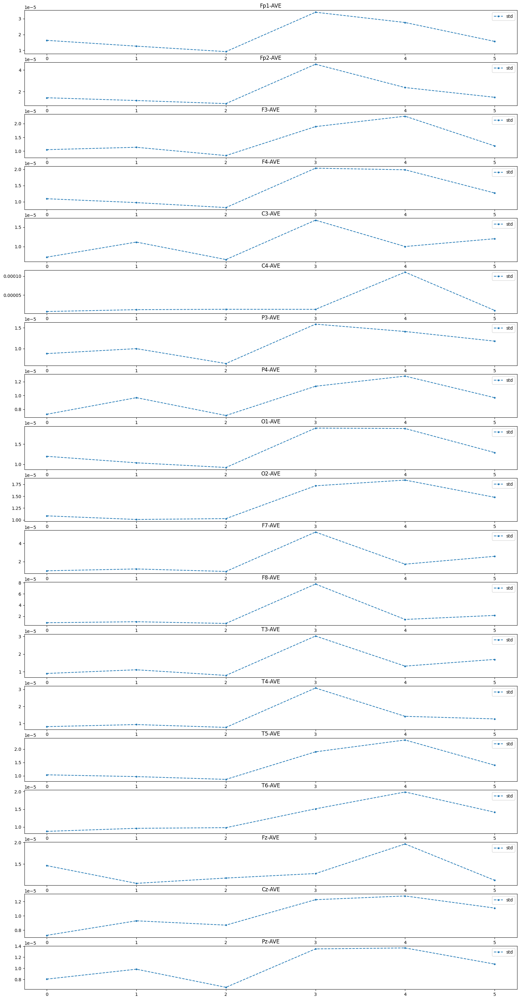

In [6]:
# Plot out the summary and save the result to VIS_FILE_DIRC folder
plot_summary(df_summary_spike, "for_all_eeg_spike")

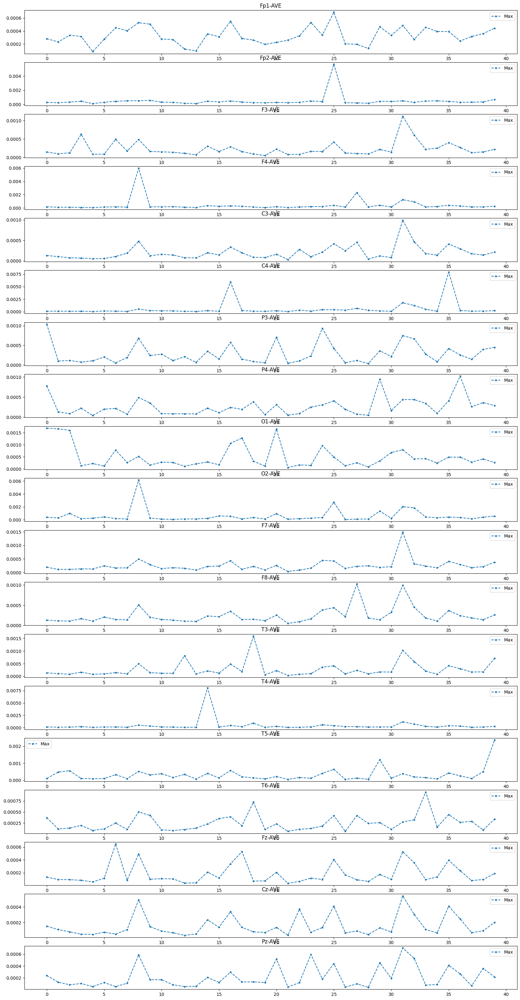

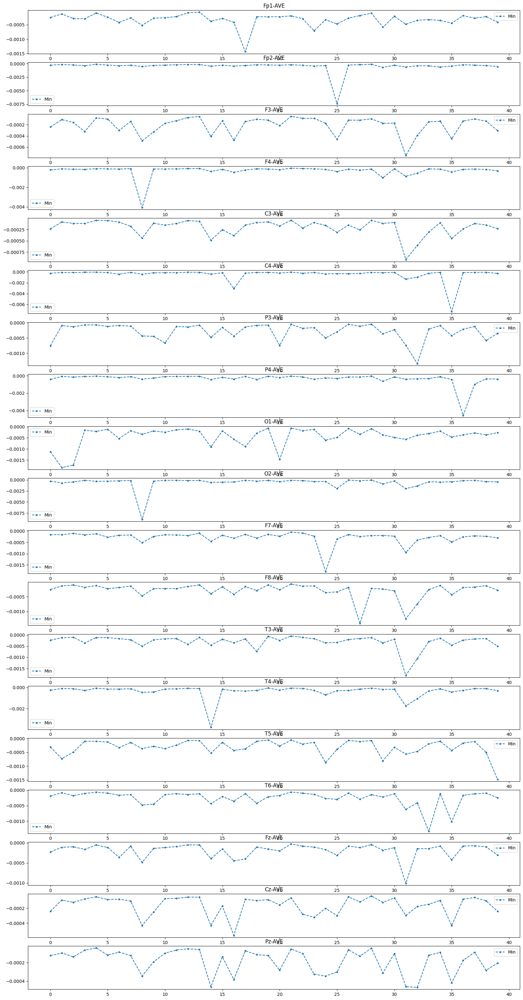

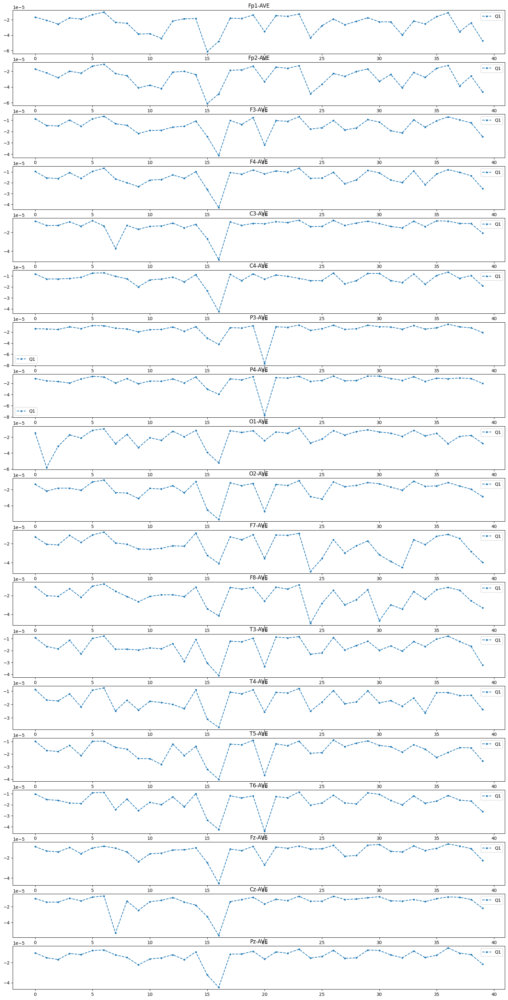

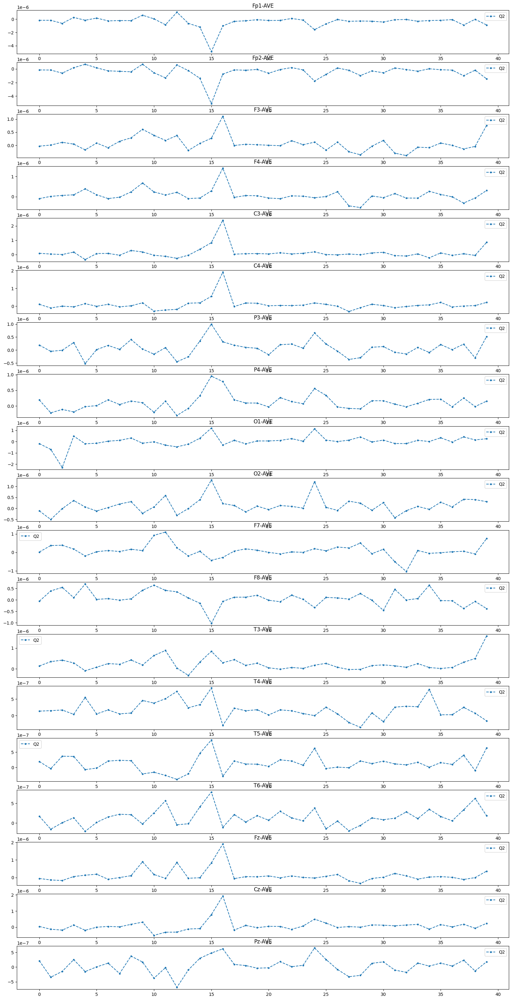

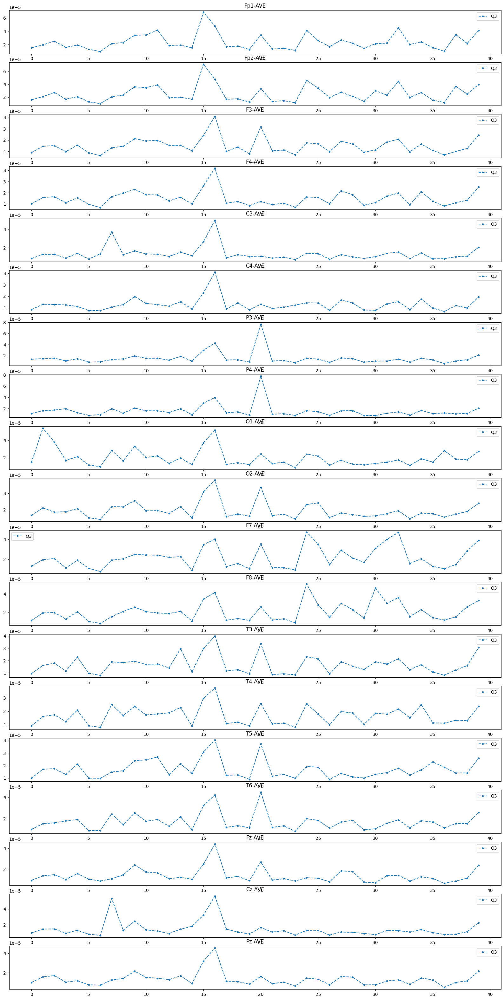

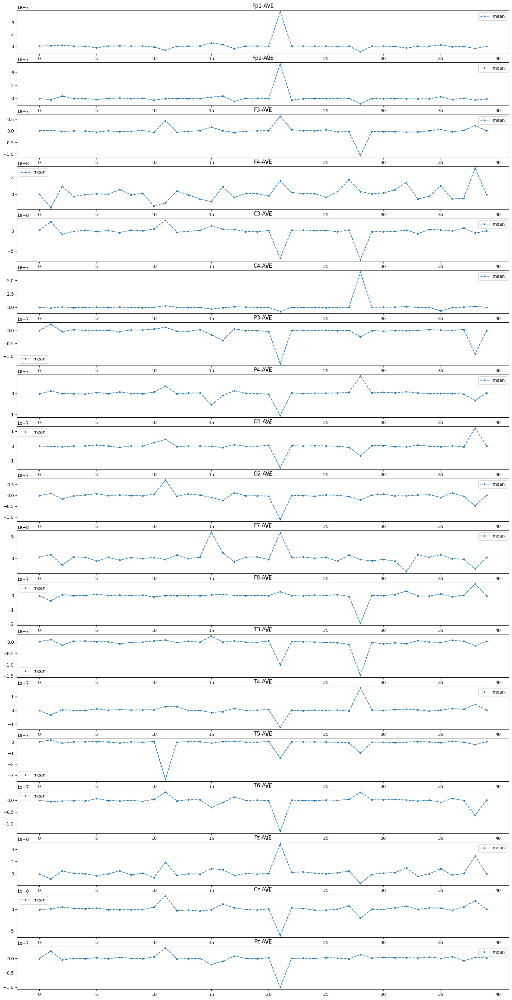

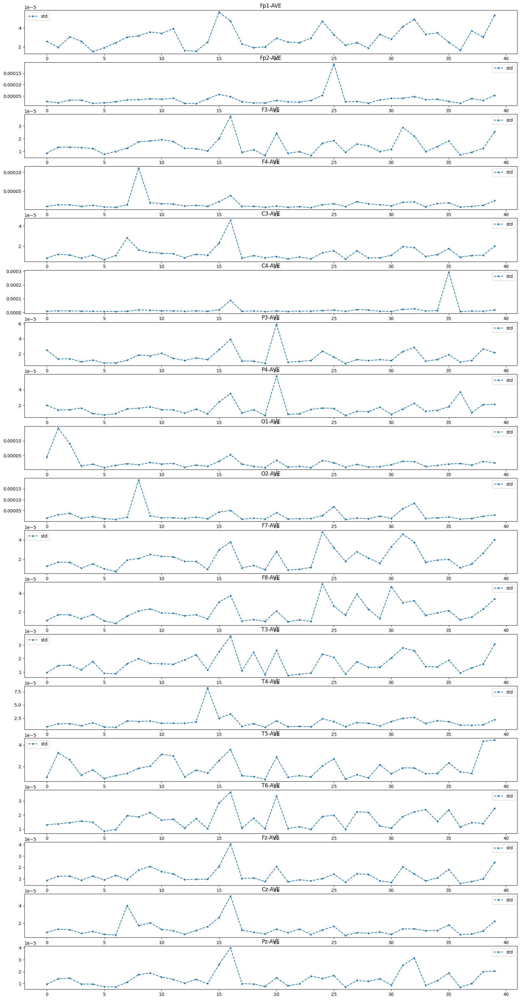

In [7]:
# Plot out the summary and save the result to VIS_FILE_DIRC folder
plot_summary(df_summary_no_spike, "for_all_eeg_no_spike")

In [8]:
# Add in overall min and overall max
df_summary_spike.loc[len(df_summary_spike)] = df_summary_spike.max(axis=0).to_numpy()
df_summary_spike.loc[len(df_summary_spike)] = df_summary_spike.min(axis=0).to_numpy()

df_summary_no_spike.loc[len(df_summary_no_spike)] = df_summary_no_spike.max(axis=0).to_numpy()
df_summary_no_spike.loc[len(df_summary_no_spike)] = df_summary_no_spike.min(axis=0).to_numpy()

In [9]:
df_summary_spike

,Fp1-AVE,Fp2-AVE,F3-AVE,F4-AVE,C3-AVE,C4-AVE,P3-AVE,P4-AVE,O1-AVE,O2-AVE,F7-AVE,F8-AVE,T3-AVE,T4-AVE,T5-AVE,T6-AVE,Fz-AVE,Cz-AVE,Pz-AVE
EEG file,,,,,,,,,,,,,,,,,,,
6 (Max),9.738965e-05,8.794673e-05,6.606751e-05,7.683879e-05,5.019784e-05,3.499735e-05,6.414331e-05,4.042986e-05,7.704353e-05,7.649301e-05,5.674910e-05,4.312715e-05,7.114828e-05,4.673879e-05,7.753804e-05,5.637431e-05,8.034357e-05,6.474864e-05,5.671790e-05
6 (Min),-1.446516e-04,-1.306569e-04,-8.436525e-05,-9.582353e-05,-4.766938e-05,-3.459964e-05,-4.819526e-05,-3.846551e-05,-4.851046e-05,-4.071154e-05,-5.654523e-05,-7.872251e-05,-6.262973e-05,-4.214222e-05,-5.460990e-05,-5.169458e-05,-1.133758e-04,-4.070579e-05,-3.561935e-05
6 (Q-90%),-1.304686e-05,-1.300980e-05,-9.408903e-06,-1.059693e-05,-8.611926e-06,-7.668327e-06,-9.952020e-06,-8.598538e-06,-1.359360e-05,-1.187925e-05,-1.101076e-05,-1.014274e-05,-1.032708e-05,-9.414737e-06,-1.158094e-05,-1.033430e-05,-1.136220e-05,-8.363017e-06,-9.105468e-06
6 (Q2),5.491468e-07,3.286580e-07,5.676235e-07,4.971750e-07,7.117538e-08,5.035224e-08,-1.936078e-07,-1.094124e-07,-6.240869e-07,-8.103086e-07,4.506314e-07,-1.583333e-07,-6.498571e-08,-1.559909e-07,-4.325643e-07,-3.117884e-07,9.364339e-07,3.582881e-08,-1.902920e-07
6 (Q-10%),1.557756e-05,1.388080e-05,1.070324e-05,1.110146e-05,8.418770e-06,7.245353e-06,9.139144e-06,7.981772e-06,1.249028e-05,1.110127e-05,1.173940e-05,1.014268e-05,1.016715e-05,9.092799e-06,1.079715e-05,9.329767e-06,1.326332e-05,8.271155e-06,8.183226e-06
6 (Mean),5.309197e-07,3.642354e-07,1.509081e-07,3.137137e-08,1.895242e-09,-4.729239e-08,-1.016937e-07,-1.062706e-07,-1.826250e-07,-1.896833e-07,1.364309e-07,-8.020192e-08,-6.657956e-08,-1.600826e-07,-1.381233e-07,-1.804431e-07,1.029381e-07,1.973661e-08,-8.544009e-08
6 (Std),1.631939e-05,1.427681e-05,1.052736e-05,1.091443e-05,7.239724e-06,6.192614e-06,8.798111e-06,7.271843e-06,1.199006e-05,1.085447e-05,9.828595e-06,8.547799e-06,9.003018e-06,8.107549e-06,1.037421e-05,8.778394e-06,1.462730e-05,7.270369e-06,8.041630e-06
19 (Max),5.472672e-05,3.954214e-05,5.082092e-05,2.923984e-05,4.544406e-05,5.200221e-05,3.474493e-05,3.840011e-05,4.187792e-05,3.702729e-05,3.796142e-05,4.193752e-05,3.805454e-05,3.157313e-05,3.043921e-05,3.377011e-05,4.526473e-05,4.722257e-05,3.631883e-05
19 (Min),-4.650763e-05,-4.704034e-05,-4.661024e-05,-3.257256e-05,-5.108817e-05,-4.663638e-05,-3.687624e-05,-3.107204e-05,-3.339223e-05,-3.462891e-05,-5.336481e-05,-3.635422e-05,-5.267862e-05,-4.438801e-05,-4.002689e-05,-3.232701e-05,-3.691189e-05,-3.281706e-05,-4.331081e-05


In [10]:
df_summary_no_spike

,Fp1-AVE,Fp2-AVE,F3-AVE,F4-AVE,C3-AVE,C4-AVE,P3-AVE,P4-AVE,O1-AVE,O2-AVE,F7-AVE,F8-AVE,T3-AVE,T4-AVE,T5-AVE,T6-AVE,Fz-AVE,Cz-AVE,Pz-AVE
EEG file,,,,,,,,,,,,,,,,,,,
1 (Max),2.818153e-04,2.627493e-04,1.474851e-04,1.628723e-04,1.326838e-04,1.095899e-04,1.039009e-03,7.798132e-04,1.686932e-03,3.930539e-04,1.967833e-04,1.315739e-04,1.400108e-04,1.377519e-04,1.085275e-04,3.690231e-04,1.318058e-04,1.540291e-04,2.395607e-04
1 (Min),-2.504632e-04,-2.700202e-04,-2.402260e-04,-2.078442e-04,-2.360113e-04,-2.538470e-04,-7.589550e-04,-4.164269e-04,-1.126600e-03,-2.929732e-04,-1.659212e-04,-2.565855e-04,-2.331545e-04,-2.556400e-04,-3.044842e-04,-1.885297e-04,-2.258554e-04,-2.411904e-04,-1.247756e-04
1 (Q-90%),-1.656429e-05,-1.715609e-05,-8.728677e-06,-9.656620e-06,-8.076847e-06,-8.117002e-06,-1.404449e-05,-1.175765e-05,-1.474433e-05,-1.325230e-05,-1.305525e-05,-1.080337e-05,-9.266851e-06,-8.880885e-06,-9.786191e-06,-1.021269e-05,-8.878605e-06,-9.879638e-06,-1.032471e-05
1 (Q2),-1.654632e-07,-1.534705e-07,-3.336649e-08,-9.790392e-08,8.765252e-08,1.067746e-07,1.917200e-07,1.898996e-07,-1.844048e-07,-1.103596e-07,1.689254e-08,-6.075062e-08,1.383678e-07,1.368159e-07,1.897556e-07,1.737046e-07,-5.297905e-08,4.013713e-08,2.153477e-07
1 (Q-10%),1.513216e-05,1.598926e-05,8.922654e-06,9.985719e-06,8.220721e-06,8.245823e-06,1.360135e-05,1.108109e-05,1.460520e-05,1.328031e-05,1.319816e-05,1.103137e-05,9.478357e-06,9.051297e-06,9.971886e-06,1.016519e-05,9.117377e-06,9.994141e-06,1.032595e-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40 (Q-10%),4.124969e-05,3.967633e-05,2.457561e-05,2.511899e-05,2.053531e-05,1.935046e-05,2.090918e-05,2.061919e-05,2.730795e-05,2.786159e-05,3.912354e-05,3.270488e-05,3.056470e-05,2.373265e-05,2.589731e-05,2.583248e-05,2.378853e-05,2.278987e-05,2.179549e-05
40 (Mean),-4.825101e-09,-6.465251e-09,6.352994e-10,-3.875844e-10,-2.440749e-10,-6.996788e-10,-7.918426e-10,9.848693e-10,1.448647e-09,2.412608e-10,1.911723e-09,-3.161871e-09,2.814495e-09,6.527659e-10,4.721821e-09,1.382363e-09,-1.368547e-10,3.062239e-10,1.612813e-09
40 (Std),5.358694e-05,5.300917e-05,2.543473e-05,2.474824e-05,1.992988e-05,1.924089e-05,2.163790e-05,2.143221e-05,2.583468e-05,3.024494e-05,4.017378e-05,3.407342e-05,3.065044e-05,2.253474e-05,4.462308e-05,2.483400e-05,2.448324e-05,2.226631e-05,2.042108e-05


### Overall range

In [11]:
def print_overall_range(df, spike_or_not:str):

    print(f"Overally, for whole eeg dataset, for the data " + '\033[1m' + spike_or_not+ '\033[0m')
    print("Maximum value",df.to_numpy().max())
    print("Minimum value",df.to_numpy().min())

    dict1 = get_list_seperately(df)
    print("\nMaximum value for quatile 90%", dict1["Q3"].max())
    print("Minimum value for quatile 10%", dict1["Q1"].min(),"\n\n")

print_overall_range(df_summary_spike, "'with spike'")
print_overall_range(df_summary_no_spike, "'without spike'")

Overally, for whole eeg dataset, for the data 'with spike'
Maximum value 0.004993674
Minimum value -0.0009383281

Maximum value for quatile 90% 0.00010275602107867599
Minimum value for quatile 10% -9.193739242618904e-05 


Overally, for whole eeg dataset, for the data 'without spike'
Maximum value 0.0080423355
Minimum value -0.008910319

Maximum value for quatile 90% 7.764219481032342e-05
Minimum value for quatile 10% -7.743434252915904e-05 




In [12]:
df_summary_spike.to_csv(f"{VIS_FILE_DIRC}/Summary_spike.csv")
df_summary_no_spike.to_csv(f"{VIS_FILE_DIRC}/Summary_no_spike.csv")

### Analysis of result
* The important part of EEG data is in range (-0.0009, 0.005)
* Overall range is in (-0.009, 0.008)
* Therefore, we need to normalize it by dividing 0.005 and apply mu law so that we can focus on signal in (-0.0009, 0.005) and at the same time magnify the data that is in quatile 10% and 90%

## Load a single processed EEG files 

In [13]:
num = 6
df = get_df(f'{CSV_FILE_DIRC}/eeg{num}.csv') # Load the eeg file after apply average montage, band pass filter and resample to 128 Hz

The data from EEG_csv/eeg6.csv is loaded 


In [14]:
df.describe()

,Fp1-AVE,Fp2-AVE,F3-AVE,F4-AVE,C3-AVE,C4-AVE,P3-AVE,P4-AVE,O1-AVE,O2-AVE,F7-AVE,F8-AVE,T3-AVE,T4-AVE,T5-AVE,T6-AVE,Fz-AVE,Cz-AVE,Pz-AVE
count,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05,4.819200e+05
mean,1.350097e-09,4.780736e-09,4.091704e-09,4.423657e-09,-2.425220e-09,-2.034200e-11,-4.942616e-09,-2.583592e-09,-4.263023e-09,-3.627763e-09,1.426272e-09,4.486746e-09,-3.308772e-09,3.319192e-10,-3.781669e-09,-4.538864e-09,7.080764e-09,4.973727e-09,-3.453773e-09
std,1.896560e-05,1.961038e-05,7.887595e-06,8.604530e-06,6.583236e-06,7.346543e-06,7.911442e-06,7.927330e-06,1.014860e-05,1.271054e-05,1.043622e-05,1.024768e-05,8.951147e-06,8.653229e-06,9.011842e-06,8.413677e-06,9.360985e-06,7.056032e-06,7.347907e-06
min,-2.430291e-04,-2.506248e-04,-9.977477e-05,-1.132751e-04,-5.128435e-05,-1.143418e-04,-1.247213e-04,-1.185946e-04,-1.122822e-04,-2.983622e-04,-2.745402e-04,-2.282598e-04,-1.204501e-04,-1.543372e-04,-1.253507e-04,-9.819475e-05,-1.156976e-04,-8.294659e-05,-1.189858e-04
25%,-6.040703e-06,-5.964590e-06,-4.348179e-06,-4.748416e-06,-3.764418e-06,-3.653164e-06,-4.096800e-06,-3.882616e-06,-5.657723e-06,-5.144254e-06,-5.260215e-06,-4.822759e-06,-4.766668e-06,-4.530984e-06,-4.892666e-06,-4.517391e-06,-5.044303e-06,-4.104237e-06,-3.873556e-06
50%,1.838314e-07,1.655536e-07,1.037149e-07,1.076943e-07,7.053161e-08,-1.561106e-09,9.615476e-09,2.586493e-09,-1.655043e-07,-1.397624e-07,5.095320e-08,1.324416e-08,7.217323e-08,4.241913e-08,-3.885862e-08,4.944292e-09,2.140723e-07,-2.619659e-09,-2.196348e-10
75%,6.354734e-06,6.219454e-06,4.561947e-06,4.887750e-06,3.843626e-06,3.644207e-06,4.099947e-06,3.845234e-06,5.433615e-06,4.933089e-06,5.406856e-06,4.850661e-06,4.833392e-06,4.586496e-06,4.851203e-06,4.504169e-06,5.415291e-06,4.110227e-06,3.894632e-06
max,2.728585e-04,2.899254e-04,9.019751e-05,1.237659e-04,5.880427e-05,1.437774e-04,2.030966e-04,1.994837e-04,1.183101e-04,4.485494e-04,2.461955e-04,2.063498e-04,9.904813e-05,1.288901e-04,1.012467e-04,1.167214e-04,1.134774e-04,7.644560e-05,1.199551e-04


## Visualize the effect of normalize and apply mu law

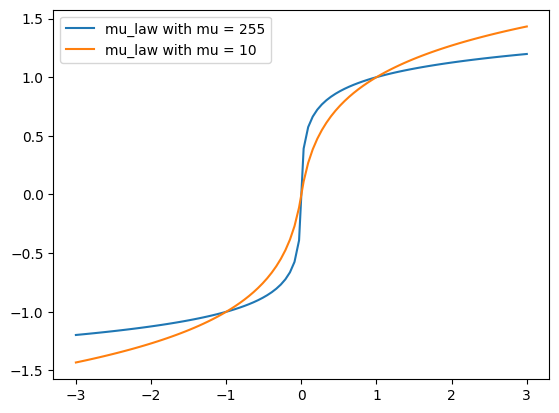

In [15]:
# Look at effect of apply mu law
arr = np.linspace(-3,3,100)
# plt.plot(arr, arr, label="Original")
plt.plot(arr, mu_law(arr), label="mu_law with mu = 255")
plt.plot(arr, mu_law(arr,10), label="mu_law with mu = 10")
plt.legend()
plt.show()

In [16]:
df_mu_law = mu_law(df/0.005)
df_mu_law.describe()

,Fp1-AVE,Fp2-AVE,F3-AVE,F4-AVE,C3-AVE,C4-AVE,P3-AVE,P4-AVE,O1-AVE,O2-AVE,F7-AVE,F8-AVE,T3-AVE,T4-AVE,T5-AVE,T6-AVE,Fz-AVE,Cz-AVE,Pz-AVE
count,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000,481920.000000
mean,0.000425,0.000370,0.000385,0.000233,0.000103,-0.000093,-0.000040,-0.000088,-0.000361,-0.000551,0.000194,0.000122,0.000155,0.000120,-0.000042,-0.000062,0.000715,0.000053,-0.000026
std,0.087073,0.087781,0.053810,0.057742,0.047667,0.048652,0.052879,0.050962,0.066045,0.064066,0.065296,0.062612,0.059298,0.056971,0.059681,0.056314,0.061081,0.050089,0.050421
min,-0.467946,-0.473087,-0.325761,-0.345082,-0.231775,-0.346523,-0.359982,-0.352160,-0.343729,-0.502424,-0.488380,-0.457508,-0.354565,-0.393641,-0.360767,-0.323359,-0.348340,-0.298361,-0.352670
25%,-0.048431,-0.047895,-0.036120,-0.039108,-0.031671,-0.030810,-0.034217,-0.032581,-0.045718,-0.042015,-0.042858,-0.039657,-0.039243,-0.037491,-0.040173,-0.037389,-0.041285,-0.034274,-0.032511
50%,0.001683,0.001516,0.000951,0.000988,0.000648,-0.000014,0.000088,0.000024,-0.001516,-0.001281,0.000468,0.000122,0.000663,0.000390,-0.000357,0.000045,0.001958,-0.000024,-0.000002
75%,0.050625,0.049683,0.037722,0.040136,0.032281,0.030741,0.034241,0.032293,0.044111,0.040470,0.043918,0.039863,0.039736,0.037905,0.039867,0.037290,0.043979,0.034319,0.032673
max,0.487346,0.497574,0.310681,0.358785,0.249956,0.382347,0.438203,0.435254,0.351788,0.572186,0.470107,0.440819,0.324660,0.365117,0.327971,0.349699,0.345356,0.286551,0.353927


### KDE Graph (Original)

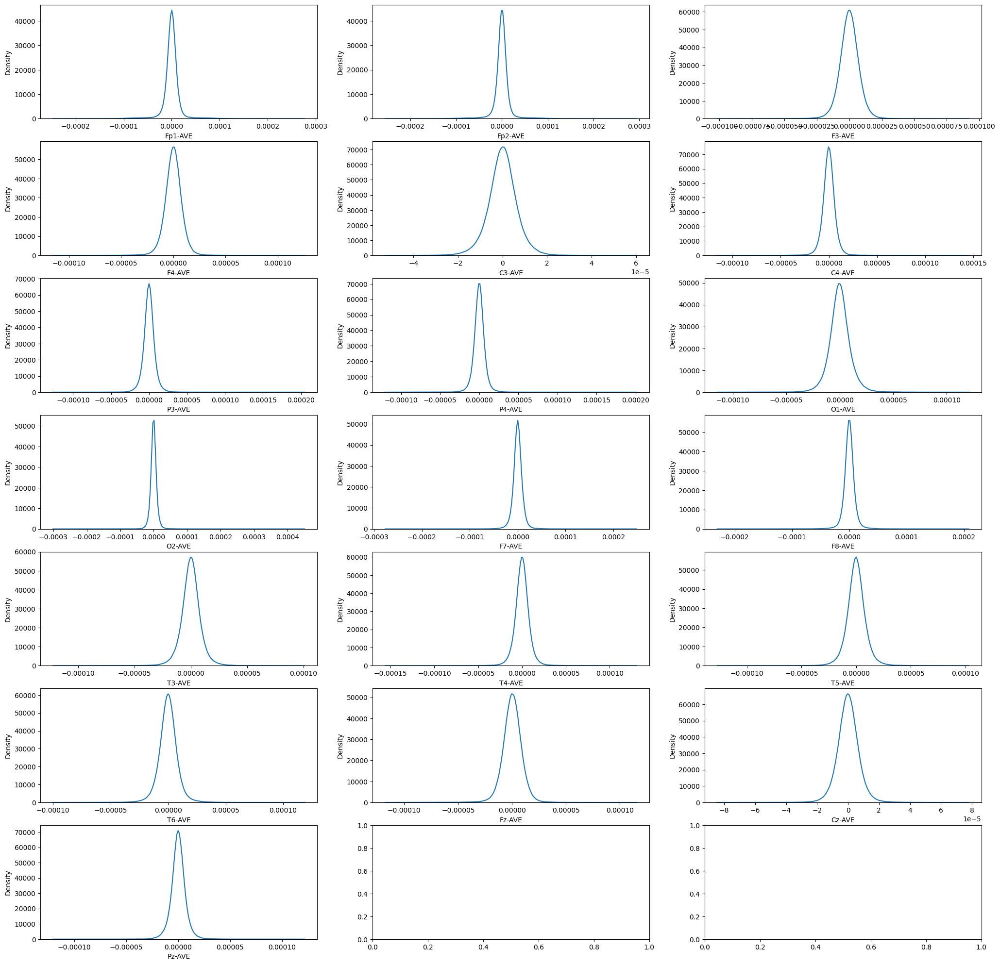

CPU times: total: 48.9 s
Wall time: 28.5 s


In [17]:
%%time
fig, ax = plt.subplots(7,3,figsize=(25,25))
for i,col in enumerate(df.columns):
    sns.kdeplot(data=df, x=col, ax=ax[i//3,i%3])
plt.show()

### KDE Graph (After normalize and apply mu_law)

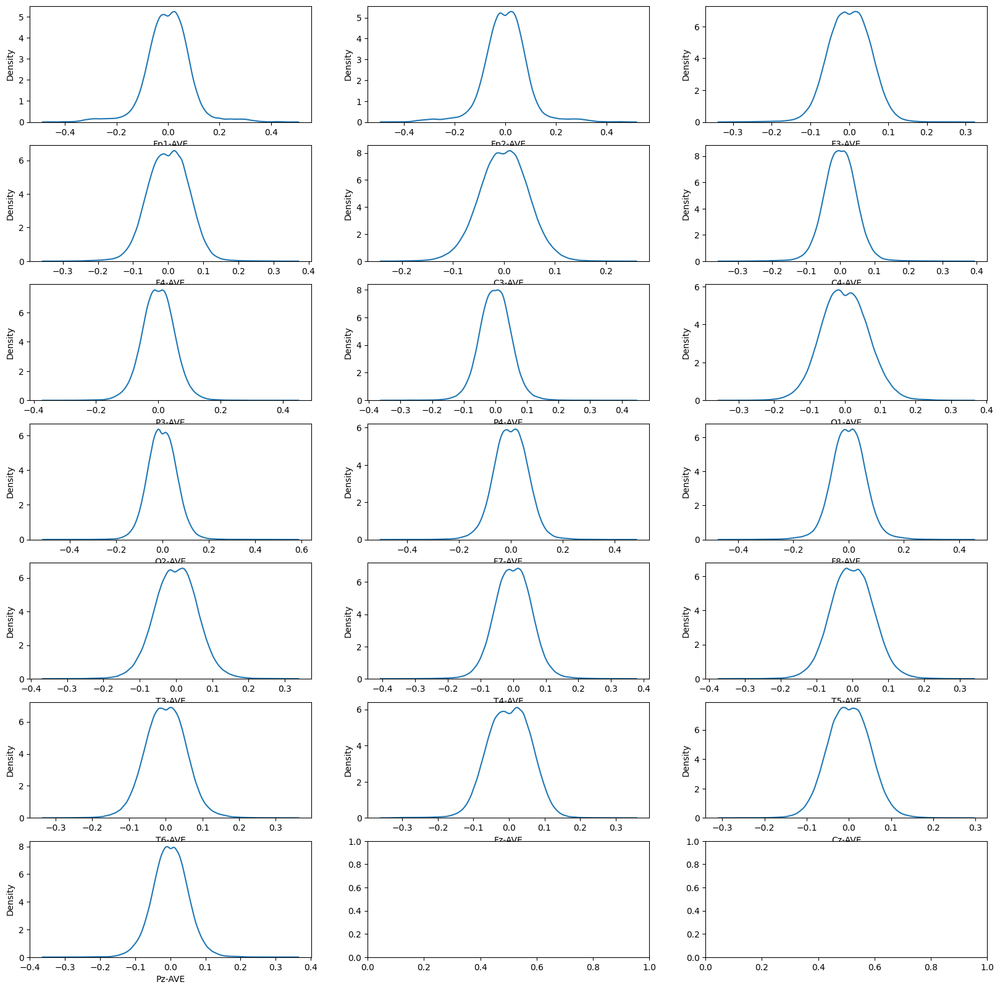

CPU times: total: 1min 4s
Wall time: 43.9 s


In [18]:
%%time
fig, ax = plt.subplots(7,3,figsize=(20,20))
for i,col in enumerate(df_mu_law.columns):
    sns.kdeplot(data=df_mu_law, x=col, ax=ax[i//3,i%3])
plt.show()

### 2D Graph (Visualize via matplotlib - Before & After)

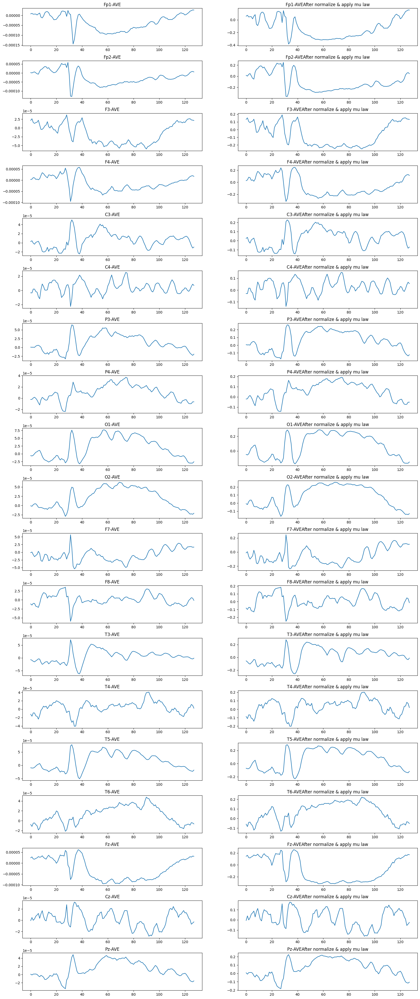

In [19]:
# This is a sample data with spike
START_INDEX = 105*NEW_FREQUENCY
END_INDEX   = 106*NEW_FREQUENCY

fig, axs = plt.subplots(len(AVE_CHANNELS_NAME), 2, figsize=(20, 50))
plt.subplots_adjust(hspace=0.4)

if type(df) != np.ndarray:
    df = df.to_numpy()
for i, col in enumerate(AVE_CHANNELS_NAME):
    axs[i][0].set_title(col)
    axs[i][0].plot(df[START_INDEX:END_INDEX,i])

if type(df_mu_law) != np.ndarray:
    df_mu_law = df_mu_law.to_numpy()
for i, col in enumerate(AVE_CHANNELS_NAME):
    axs[i][1].set_title(col + "After normalize & apply mu law")
    axs[i][1].plot(df_mu_law[START_INDEX:END_INDEX,i])
    
SAVE_PATH = f'{VIS_FILE_DIRC}/signal.png'
plt.savefig(SAVE_PATH, transparent = False,  facecolor = 'white')
plt.show()

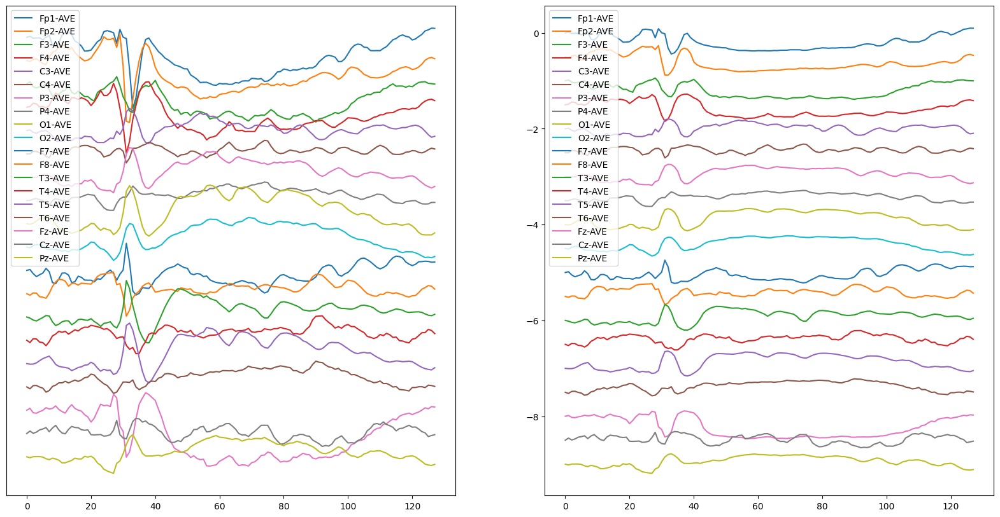

In [20]:
# START_INDEX = 269*NEW_FREQUENCY
# END_INDEX   = 271*NEW_FREQUENCY
START_INDEX = 105*NEW_FREQUENCY
END_INDEX   = 106*NEW_FREQUENCY


fig, axs = plt.subplots(1, 2, figsize=(20, 10))
plt.subplots_adjust(hspace=0.4)

if type(df) != np.ndarray:
    df = df.to_numpy()
seperate=5e-5
for i, col in enumerate(AVE_CHANNELS_NAME):
    axs[0].plot(df[START_INDEX:END_INDEX,i]-df[START_INDEX,i]-seperate*i, label=col)
    axs[0].set_yticks([])
    axs[0].legend()
    
if type(df_mu_law) != np.ndarray:
    df_mu_law = df_mu_law.to_numpy()
seperate=0.5
for i, col in enumerate(AVE_CHANNELS_NAME):
    axs[1].plot(df_mu_law[START_INDEX:END_INDEX,i]-df_mu_law[START_INDEX,i]-seperate*i, label=col)
    axs[1].legend()

SAVE_PATH = f'{VIS_FILE_DIRC}/signal.png'
plt.savefig(SAVE_PATH, transparent = False,  facecolor = 'white')
plt.show()

### 2D Graph with diffused signal

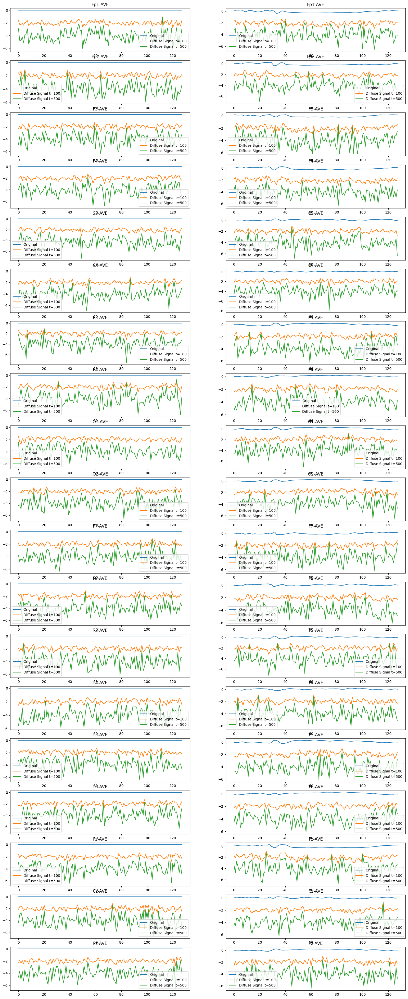

In [21]:
t_list    = [100, 500]
seperated = 2
fig, axs = plt.subplots(len(AVE_CHANNELS_NAME), 2, figsize=(20, 50))

def plot_eeg(df_used, k):
    x_0 = torch.tensor(df_used[START_INDEX:END_INDEX]) 
    eps = torch.randn_like(x_0) 
    x_t = []

    for t in t_list:
        x_t.append(q_sample(x_0, alphas_prod_p_sqrt[t-1], eps))

    for i, col in enumerate(AVE_CHANNELS_NAME):
        axs[i][k].set_title(col)
        axs[i][k].plot(x_0[:,i], label = "Original")
        for j in range(len(t_list)):
            axs[i][k].plot(x_t[j][:,i] - seperated*(j+1), label = f"Diffuse Signal t={t_list[j]}")                 
        axs[i][k].legend()

# For EEG data after apply average montage, band pass filter and resample to 128 Hz
plot_eeg(df, 0)
# plot_eeg(df/0.005, 0) # After normalize, it also only have limited difference               
         
# For EEG data after apply average montage, band pass filter and resample to 128 Hz, normalize and apply mu law
plot_eeg(df_mu_law, 1)
                        

SAVE_PATH = f'{VIS_FILE_DIRC}\diffuseSignal.png'
plt.savefig(SAVE_PATH, transparent = False,  facecolor = 'white')
plt.show()


## Determine maximum value after normalize and apply mu law

In [22]:
# Create empty dataframe
df_summary = pd.DataFrame(columns=["EEG file"] + AVE_CHANNELS_NAME)
df_summary
def append_result_max(num, df_summary, df):
    df = mu_law(df / 0.005)
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Max)"]  , df.max(axis=0).to_numpy() ))           # Add in the maximum value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Min)"]  , df.min(axis=0).to_numpy() )) 
    
    return df_summary

In [23]:
%%time
for num in range(1,41):
    df = get_df(f'{CSV_FILE_DIRC}/eeg{num}.csv')
    df_summary = append_result_max(num, df_summary, df) 

The data from EEG_csv/eeg1.csv is loaded 
The data from EEG_csv/eeg2.csv is loaded 
The data from EEG_csv/eeg3.csv is loaded 
The data from EEG_csv/eeg4.csv is loaded 
The data from EEG_csv/eeg5.csv is loaded 
The data from EEG_csv/eeg6.csv is loaded 
The data from EEG_csv/eeg7.csv is loaded 
The data from EEG_csv/eeg8.csv is loaded 
The data from EEG_csv/eeg9.csv is loaded 
The data from EEG_csv/eeg10.csv is loaded 
The data from EEG_csv/eeg11.csv is loaded 
The data from EEG_csv/eeg12.csv is loaded 
The data from EEG_csv/eeg13.csv is loaded 
The data from EEG_csv/eeg14.csv is loaded 
The data from EEG_csv/eeg15.csv is loaded 
The data from EEG_csv/eeg16.csv is loaded 
The data from EEG_csv/eeg17.csv is loaded 
The data from EEG_csv/eeg18.csv is loaded 
The data from EEG_csv/eeg19.csv is loaded 
The data from EEG_csv/eeg20.csv is loaded 
The data from EEG_csv/eeg21.csv is loaded 
The data from EEG_csv/eeg22.csv is loaded 
The data from EEG_csv/eeg23.csv is loaded 
The data from EEG_cs

In [24]:
df_summary = df_summary.set_index('EEG file')
df_summary = df_summary.astype(np.float32)

In [25]:
print("For each channel:\n", pd.concat([df_summary.max(axis=0), df_summary.min(axis=0)], axis=1))
print("Maximum value overally:", df_summary.max().max())
print("Minimum value overally:", df_summary.min().min())

For each channel:
                 0         1
Fp1-AVE  0.647363 -0.776383
Fp2-AVE  1.022426 -1.070022
F3-AVE   0.732317 -0.662055
F4-AVE   1.032452 -0.963082
C3-AVE   0.711181 -0.696446
C4-AVE   1.082332 -1.068397
P3-AVE   0.719326 -0.764278
P4-AVE   0.716586 -0.983779
O1-AVE   0.805438 -0.820960
O2-AVE   1.037046 -1.103884
F7-AVE   0.783274 -0.815578
F8-AVE   0.716694 -0.772503
T3-AVE   0.795345 -0.818064
T4-AVE   1.085444 -0.948998
T5-AVE   0.865645 -0.781927
T6-AVE   0.704425 -0.762890
Fz-AVE   0.636192 -0.714313
Cz-AVE   0.605045 -0.611812
Pz-AVE   0.651117 -0.578857
Maximum value overally: 1.0854442
Minimum value overally: -1.1038842


* From here, the value use to normalize the EEG data to range between [-1, 1] will be 1.11